In [141]:
import numpy as np
import pandas as pd
from scipy import sparse
from scipy import spatial
from sklearn.preprocessing import LabelEncoder
from sklearn.cluster import KMeans

In [8]:
df = pd.read_csv(r"C:\Users\milesbailey\Documents\Spatial\phenotype.csv")

In [9]:
#Computes the Centroid positons based on the bounding box and converts the values into mm instead of microns 
df["Pos_X"] = (((df["Object.Info...Envelope.left"] + df["Object.Info...Envelope.right"]) / 2) * 1000).astype(int)
df["Pos_Y"] = (((df["Object.Info...Envelope.top"] + df["Object.Info...Envelope.bottom"]) / 2) * 1000).astype(int)
df["Pos_X"] = df["Pos_X"] - df["Pos_X"].min()
df["Pos_Y"] = df["Pos_Y"] - df["Pos_Y"].min()

In [10]:
df["phenotype_value"] = LabelEncoder().fit_transform(df["phenotype_name"])

In [11]:
xy = df.groupby(by=["Name"])[["Pos_X","Pos_Y","phenotype_value"]]
xy.apply(round)

Pos_X  Pos_Y  phenotype_value
Name                                             
Grid (1, A) 0        1482  11873                2
            1        1470  11872                9
            2        1462  11872                3
            3        1471  11864               15
            4        1481  11865                2
...                   ...    ...              ...
Grid (3, D) 392586   6760     31                1
            392587   6739     29                7
            392588   6736     21                7
            392589   6959     19                0
            392590   6967     13                2

[392591 rows x 3 columns]

In [131]:
for key, item in xy:
    print(key)
    print(xy.get_group(key), "\n\n")

('Grid (1, A)',)
       Pos_X  Pos_Y         phenotype_name
0       1482  11873  CD4_Regulatory_T_Cell
1       1470  11872               Negative
2       1462  11872                   CD68
3       1471  11864          T_Helper_Cell
4       1481  11865  CD4_Regulatory_T_Cell
...      ...    ...                    ...
11352   2019   9982                    CD4
11353   2031   9979            PanCK_Sox10
11354   2048   9979            PanCK_Sox10
11355   2009   9977                    CD4
11356   2017   9978                    CD4

[11357 rows x 3 columns] 


('Grid (1, B)',)
        Pos_X  Pos_Y phenotype_name
129918   1028   7745          FoxP3
129919   1020   7739          FoxP3
129920   1045   7737          FoxP3
129921    994   7737          FoxP3
129922   1003   7734    PanCK_Sox10
...       ...    ...            ...
149953   1507   5828          FoxP3
149954   1495   5827          FoxP3
149955   1547   5829          FoxP3
149956   1538   5826          FoxP3
149957   1479   5820     

In [138]:
#SpatialGraph = xy.apply(lambda x: sparse.coo_matrix(x.phenotype_name,(x.Pos_X.astype(int).to_numpy(), x.Pos_Y.astype(int).to_numpy()),shape = (x.Pos_X.max() + 1, x.Pos_Y.max() + 1)))
SpatialGraph = df.groupby("Name").apply(lambda x: sparse.coo_matrix((x["phenotype_value"].to_numpy(),(x["Pos_X"].astype(int).to_numpy(),x["Pos_Y"].astype(int).to_numpy())),shape=(x["Pos_X"].max() + 1, x["Pos_Y"].max() + 1)))

C:\Users\milesbailey\AppData\Local\Temp\ipykernel_40548\4260388764.py:2: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  SpatialGraph = df.groupby("Name").apply(lambda x: sparse.coo_matrix((x["phenotype_value"].to_numpy(),(x["Pos_X"].astype(int).to_numpy(),x["Pos_Y"].astype(int).to_numpy())),shape=(x["Pos_X"].max() + 1, x["Pos_Y"].max() + 1)))


In [20]:
import hvplot.pandas
df.hvplot.points('Pos_X','Pos_Y',color = "phenotype_name")

:Points   [Pos_X,Pos_Y]   (phenotype_name)

In [14]:
phenotype_summary = df['phenotype_name'].value_counts().reset_index()
phenotype_summary.columns = ['phenotype_name', 'Count']
phenotype_summary = phenotype_summary.sort_values('Count', ascending=False)

print("\nPhenotype distribution:")
print(phenotype_summary.to_string(index=False))


Phenotype distribution:
            phenotype_name  Count
                  Negative  90051
             T_Helper_Cell  86353
               PanCK_Sox10  39867
                      CD68  30441
                       CD4  28557
          Cytotoxic_T_Cell  27582
        PDL1_T_Helper_Cell  21424
                       CD3  17071
     CD4_Regulatory_T_Cell  14077
                       CD8  11416
                      PDL1   7475
                     FoxP3   6528
Immune_Evading_Tumour_Cell   5554
     PDL1_Cytotoxic_T_Cell   3898
     CD8_Regulatory_T_Cell   1283
                       PD1   1014


In [1]:
# Define your phenotype color mapping in Python
celltype_colors = {
    # ---- T cell lineage markers ----
    "CD3": "#AEC6CF",   # pastel blue-gray
    "CD4": "#77DD77",   # pastel green
    "CD8": "#FFB347",   # pastel orange

    # ---- T cell functional subsets ----
    "T_Helper_Cell": "#CBAACB",               # pastel lavender
    "Cytotoxic_T_Cell": "#FF6961",            # pastel red
    "Activated_Cytotoxic_T_Cell": "#FDFD96",  # pastel yellow
    "CD4_Regulatory_T_Cell": "#779ECB",       # pastel steel blue
    "CD8_Regulatory_T_Cell": "#B39EB5",       # pastel purple-gray

    # ---- Proliferating T cell subsets ----
    "Proliferating_T_Helper_Cell": "#77DDDD",               # pastel teal
    "Proliferating_Cytotoxic_T_Cell": "#FFB3BA",            # pastel pink
    "Proliferating_Activated_Cytotoxic_T_Cell": "#F49AC2",  # pastel rose

    # ---- Functional/regulatory markers ----
    "FoxP3": "#DEA5A4",     # pastel salmon
    "GranzymeB": "#B0E0E6", # pastel powder blue
    "Ki67": "#CFCFC4",      # pastel gray

    # ---- Immune checkpoint / evasion ----
    "PDL1": "#FFD1DC",                           # pastel blush
    "PDL1_T_Helper_Cell": "#E6E6FA",             # pastel lavender
    "PDL1_Cytotoxic_T_Cell": "#FFE4B5",          # pastel moccasin
    "Immune_Evading_Tumour_Cell": "#FFDAC5",     # pastel peach
    "Proliferating_Immune_Evading_Tumour_Cell": "#E0BBE4",  # pastel lilac

    # ---- Tumour lineage / context ----
    "PanCK_Sox10": "#D5AAFF",            # pastel violet
    "Proliferating_Tumour_Cell": "#C1E1C1",  # pastel mint

    # ---- Other ----
    "Negative": "#F5F5DC"  # pastel beige
}

In [2]:
import holoviews as hv
import hvplot.pandas
positivity_cols = [
       'Positivity...CD3..Biomarker.intensity..Cell.body..',
       'Positivity...CD4..Biomarker.intensity..Cell.body..',
       'Positivity...CD68..Biomarker.intensity..Cell.body..',
       'Positivity...CD8..Biomarker.intensity..Cell.body..',
       'Positivity...CK.Sox10..Biomarker.intensity..Entire.cell..',
       'Positivity...FoxP3..Biomarker.intensity..Nucleus..',
       'Positivity...PD.1..Biomarker.intensity..Cell.body..',
       'Positivity...PD.L1..Biomarker.intensity..Cell.body..'
]

# Solution 1: Explicit color mapping with clim
plots = []
for col in positivity_cols:
    # Ensure binary values and set explicit color limits
    p = df.hvplot.points(
        'Pos_X', 'Pos_Y',
        color=col,
        cmap=['lightgrey', 'orange'],
        clim=(0, 1),  # Explicitly set color limits
        size=10,
        title=col.replace('..', ' ').replace('.', ' '),
        colorbar=False
    )
    plots.append(p)

phenotype_plot = df.hvplot.points(
    'Pos_X', 'Pos_Y',
    color='phenotype_name',
    size=10,
    title='Phenotype Classification',
    # color_key = celltype_colors,
    legend = False  
)
plots.append(phenotype_plot)

overlay1 = hv.Layout(plots).cols(3)
hvplot.show(overlay1)
# overlay1

NameError: name 'df' is not defined

In [1]:
overlay1 = hv.Layout(plots).cols(3).opts(
    shared_axes=False,
    aspect='equal',
    framewise=True
)

NameError: name 'hv' is not defined

In [ ]:
import numpy as np
import pandas as pd
from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import LabelEncoder
import networkx as nx
from scipy.sparse import lil_matrix, csr_matrix
from typing import Optional, Dict, List

class SpatialKNNGraph:
    """
    Memory-efficient KNN graph construction for spatial cell data.
    Builds separate graphs for each sample/image.
    """
    
    def __init__(self, n_neighbors: int = 15, max_dist: Optional[float] = None,
                 algorithm: str = 'auto', metric: str = 'euclidean',
                 n_jobs: int = -1):
        """
        Parameters:
        -----------
        n_neighbors : int
            Number of nearest neighbors to find
        max_dist : float, optional
            Maximum distance threshold for edges (in same units as coordinates)
        algorithm : str
            Algorithm for KNN ('auto', 'ball_tree', 'kd_tree', 'brute')
        metric : str
            Distance metric
        n_jobs : int
            Number of parallel jobs (-1 uses all cores)
        """
        self.n_neighbors = n_neighbors
        self.max_dist = max_dist
        self.algorithm = algorithm
        self.metric = metric
        self.n_jobs = n_jobs
    
    def fit_transform_grouped(self, df: pd.DataFrame, 
                             sample_col: str = 'Name',
                             x_col: str = 'Pos_X',
                             y_col: str = 'Pos_Y',
                             phenotype_col: str = 'phenotype_value') -> Dict[str, nx.Graph]:
        """
        Build KNN graphs for each sample separately.
        
        Parameters:
        -----------
        df : pd.DataFrame
            DataFrame with spatial data
        sample_col : str
            Column name containing sample/image identifiers
        x_col : str
            Column name for X coordinates
        y_col : str
            Column name for Y coordinates
        phenotype_col : str
            Column name for phenotype labels
            
        Returns:
        --------
        graphs : dict
            Dictionary mapping sample names to NetworkX graphs
        """
        graphs = {}
        
        for sample_name, group_df in df.groupby(sample_col):
            print(f"Processing {sample_name}: {len(group_df)} cells")
            
            # Extract coordinates
            coords = group_df[[x_col, y_col]].values
            
            # Build graph for this sample
            graph = self._build_graph_for_sample(
                coords, 
                group_df.index.values,
                group_df[phenotype_col].values if phenotype_col in group_df.columns else None
            )
            
            graphs[sample_name] = graph
        
        return graphs
    
    def _build_graph_for_sample(self, coords: np.ndarray, 
                                cell_ids: np.ndarray,
                                phenotypes: Optional[np.ndarray] = None) -> nx.Graph:
        """Build KNN graph for a single sample."""
        n_samples = coords.shape[0]
        
        # Handle case where there are fewer cells than k neighbors
        k = min(self.n_neighbors, n_samples - 1)
        
        if k < 1:
            # Not enough cells to build a graph
            G = nx.Graph()
            G.add_nodes_from(cell_ids)
            return G
        
        # Fit KNN model
        nbrs = NearestNeighbors(
            n_neighbors=k + 1,  # +1 because first neighbor is the point itself
            algorithm=self.algorithm,
            metric=self.metric,
            n_jobs=self.n_jobs
        )
        nbrs.fit(coords)
        
        # Create graph
        G = nx.Graph()
        
        if self.max_dist is None:
            # Get neighbors without distances
            indices = nbrs.kneighbors(coords, return_distance=False)
            
            for i, cell_id in enumerate(cell_ids):
                # Add node with attributes
                node_attrs = {'x': coords[i, 0], 'y': coords[i, 1]}
                if phenotypes is not None:
                    node_attrs['phenotype'] = phenotypes[i]
                G.add_node(cell_id, **node_attrs)
                
                # Add edges (skip first neighbor which is itself)
                for neighbor_idx in indices[i][1:]:
                    neighbor_id = cell_ids[neighbor_idx]
                    G.add_edge(cell_id, neighbor_id)
        else:
            # Get neighbors with distances for filtering
            distances, indices = nbrs.kneighbors(coords, return_distance=True)
            
            for i, cell_id in enumerate(cell_ids):
                # Add node with attributes
                node_attrs = {'x': coords[i, 0], 'y': coords[i, 1]}
                if phenotypes is not None:
                    node_attrs['phenotype'] = phenotypes[i]
                G.add_node(cell_id, **node_attrs)
                
                # Add edges with distance filtering (skip first neighbor which is itself)
                for neighbor_idx, dist in zip(indices[i][1:], distances[i][1:]):
                    if dist <= self.max_dist:
                        neighbor_id = cell_ids[neighbor_idx]
                        G.add_edge(cell_id, neighbor_id, weight=dist)
        
        return G
    
    def fit_transform_sparse_grouped(self, df: pd.DataFrame,
                                     sample_col: str = 'Name',
                                     x_col: str = 'Pos_X',
                                     y_col: str = 'Pos_Y') -> Dict[str, csr_matrix]:
        """
        Build sparse adjacency matrices for each sample.
        More memory efficient than NetworkX graphs.
        
        Returns:
        --------
        adjacencies : dict
            Dictionary mapping sample names to sparse adjacency matrices
        """
        adjacencies = {}
        
        for sample_name, group_df in df.groupby(sample_col):
            print(f"Processing {sample_name}: {len(group_df)} cells")
            
            coords = group_df[[x_col, y_col]].values
            n_samples = coords.shape[0]
            k = min(self.n_neighbors, n_samples - 1)
            
            if k < 1:
                # Return empty sparse matrix
                adjacencies[sample_name] = csr_matrix((n_samples, n_samples))
                continue
            
            nbrs = NearestNeighbors(
                n_neighbors=k + 1,
                algorithm=self.algorithm,
                metric=self.metric,
                n_jobs=self.n_jobs
            )
            nbrs.fit(coords)
            
            if self.max_dist is None:
                # Use built-in sparse graph generation
                adjacency = nbrs.kneighbors_graph(coords, mode='connectivity')
            else:
                distances, indices = nbrs.kneighbors(coords, return_distance=True)
                adjacency = lil_matrix((n_samples, n_samples), dtype=np.float32)
                
                for i in range(n_samples):
                    # Skip first neighbor (itself) and filter by distance
                    valid_mask = distances[i][1:] <= self.max_dist
                    valid_neighbors = indices[i][1:][valid_mask]
                    adjacency[i, valid_neighbors] = 1.0
            
            # Make symmetric and convert to CSR
            adjacency = adjacency.maximum(adjacency.T)
            adjacencies[sample_name] = adjacency.tocsr()
        
        return adjacencies


def prepare_spatial_data(df: pd.DataFrame) -> pd.DataFrame:
    """
    Prepare spatial data from raw coordinates (matching your preprocessing).
    
    Parameters:
    -----------
    df : pd.DataFrame
        DataFrame with envelope coordinates and phenotype information
        
    Returns:
    --------
    df : pd.DataFrame
        DataFrame with computed centroids and encoded phenotypes
    """
    # Compute centroids and convert microns to mm
    df["Pos_X"] = (((df["Object.Info...Envelope.left"] + df["Object.Info...Envelope.right"]) / 2) * 1000).astype(int)
    df["Pos_Y"] = (((df["Object.Info...Envelope.top"] + df["Object.Info...Envelope.bottom"]) / 2) * 1000).astype(int)
    
    # Normalize to origin
    df["Pos_X"] = df["Pos_X"] - df["Pos_X"].min()
    df["Pos_Y"] = df["Pos_Y"] - df["Pos_Y"].min()
    
    # Encode phenotypes
    df["phenotype_value"] = LabelEncoder().fit_transform(df["phenotype_name"])
    
    return df


# Example usage
if __name__ == "__main__":
    # Assuming you have your dataframe 'df' already loaded
    # df = pd.read_csv('your_data.csv')
    
    # If you need to prepare the data (run once):
    # df = prepare_spatial_data(df)
    
    # Build KNN graphs for each sample
    knn_builder = SpatialKNNGraph(
        n_neighbors=15,
        max_dist=30,  # Set to a distance threshold if needed (e.g., 100 for 100mm)
        algorithm='auto',
        metric='euclidean'
    )
    
    # Option 1: NetworkX graphs (good for graph analysis)
    print("Building NetworkX graphs per sample...")
    graphs = knn_builder.fit_transform_grouped(
        df,
        sample_col='Name',
        x_col='Pos_X',
        y_col='Pos_Y',
        phenotype_col='phenotype_value'
    )
    
    # Access individual sample graphs
    for sample_name, graph in graphs.items():
        print(f"\n{sample_name}:")
        print(f"  Nodes: {graph.number_of_nodes()}")
        print(f"  Edges: {graph.number_of_edges()}")
        print(f"  Average degree: {sum(dict(graph.degree()).values()) / graph.number_of_nodes():.2f}")
    
    # Option 2: Sparse matrices (more memory efficient)
    print("\n\nBuilding sparse adjacency matrices per sample...")
    adjacencies = knn_builder.fit_transform_sparse_grouped(
        df,
        sample_col='Name',
        x_col='Pos_X',
        y_col='Pos_Y'
    )
    
    for sample_name, adj_matrix in adjacencies.items():
        print(f"\n{sample_name}:")
        print(f"  Matrix shape: {adj_matrix.shape}")
        print(f"  Non-zero entries: {adj_matrix.nnz}")
        print(f"  Sparsity: {100 * (1 - adj_matrix.nnz / (adj_matrix.shape[0]**2)):.2f}%")
    
    # Example: Extract graph for specific sample
    # sample_graph = graphs['Sample_001']
    # You can now perform graph analysis on this

Building NetworkX graphs per sample...
Processing Grid (1, A): 11357 cells
Processing Grid (1, B): 20040 cells
Processing Grid (1, C): 24404 cells
Processing Grid (1, D): 53264 cells
Processing Grid (2, A): 54057 cells
Processing Grid (2, B): 32587 cells
Processing Grid (2, C): 21690 cells
Processing Grid (2, D): 16047 cells
Processing Grid (3, A): 64504 cells
Processing Grid (3, B): 10652 cells
Processing Grid (3, C): 59716 cells
Processing Grid (3, D): 24273 cells

Grid (1, A):
  Nodes: 11357
  Edges: 96393
  Average degree: 16.98

Grid (1, B):
  Nodes: 20040
  Edges: 163337
  Average degree: 16.30

Grid (1, C):
  Nodes: 24404
  Edges: 200341
  Average degree: 16.42

Grid (1, D):
  Nodes: 53264
  Edges: 432468
  Average degree: 16.24

Grid (2, A):
  Nodes: 54057
  Edges: 435395
  Average degree: 16.11

Grid (2, B):
  Nodes: 32587
  Edges: 269924
  Average degree: 16.57

Grid (2, C):
  Nodes: 21690
  Edges: 178074
  Average degree: 16.42

Grid (2, D):
  Nodes: 16047
  Edges: 136618
  

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
from matplotlib.patches import Circle
from matplotlib.collections import LineCollection
import seaborn as sns
from typing import Optional, Dict, List, Tuple

class SpatialGraphVisualizer:
    """
    Visualization tools for spatial KNN graphs.
    """
    
    def __init__(self, figsize: Tuple[int, int] = (12, 10), dpi: int = 100):
        """
        Parameters:
        -----------
        figsize : tuple
            Figure size (width, height)
        dpi : int
            Resolution
        """
        self.figsize = figsize
        self.dpi = dpi
        
    def plot_sample_graph(self, graph: nx.Graph, 
                         sample_name: str = "Sample",
                         node_size: float = 20,
                         edge_alpha: float = 0.3,
                         edge_width: float = 0.5,
                         show_phenotypes: bool = True,
                         phenotype_colors: Optional[Dict] = None,
                         max_edges: Optional[int] = None):
        """
        Plot a single sample's KNN graph.
        
        Parameters:
        -----------
        graph : nx.Graph
            NetworkX graph with 'x', 'y' node attributes
        sample_name : str
            Name for the plot title
        node_size : float
            Size of cell nodes
        edge_alpha : float
            Transparency of edges
        edge_width : float
            Width of edge lines
        show_phenotypes : bool
            Color nodes by phenotype if available
        phenotype_colors : dict, optional
            Custom color mapping for phenotypes
        max_edges : int, optional
            Limit number of edges drawn (for very dense graphs)
        """
        fig, ax = plt.subplots(figsize=self.figsize, dpi=self.dpi)
        
        # Extract positions from node attributes
        pos = {node: (data['x'], data['y']) for node, data in graph.nodes(data=True)}
        
        # Get phenotypes if available
        phenotypes = None
        if show_phenotypes and 'phenotype' in next(iter(graph.nodes(data=True)))[1]:
            phenotypes = [data['phenotype'] for node, data in graph.nodes(data=True)]
        
        # Draw edges (with optional subsampling for dense graphs)
        edges = list(graph.edges())
        if max_edges and len(edges) > max_edges:
            edges = np.random.choice(len(edges), max_edges, replace=False)
            edges = [list(graph.edges())[i] for i in edges]
            ax.set_title(f"{sample_name}\n(showing {max_edges:,} of {graph.number_of_edges():,} edges)")
        else:
            ax.set_title(f"{sample_name}")
        
        # Draw edges efficiently using LineCollection
        edge_pos = np.array([(pos[e[0]], pos[e[1]]) for e in edges])
        edge_collection = LineCollection(
            edge_pos, 
            colors='gray', 
            linewidths=edge_width, 
            alpha=edge_alpha,
            zorder=1
        )
        ax.add_collection(edge_collection)
        
        # Draw nodes
        if phenotypes is not None:
            # Color by phenotype
            unique_phenotypes = sorted(set(phenotypes))
            
            if phenotype_colors is None:
                # Generate colors
                if len(unique_phenotypes) <= 10:
                    colors = plt.cm.tab10(np.linspace(0, 1, len(unique_phenotypes)))
                else:
                    colors = plt.cm.tab20(np.linspace(0, 1, len(unique_phenotypes)))
                phenotype_colors = {p: colors[i] for i, p in enumerate(unique_phenotypes)}
            
            # Plot each phenotype separately for legend
            for phenotype in unique_phenotypes:
                nodes_with_phenotype = [n for n, p in zip(graph.nodes(), phenotypes) if p == phenotype]
                node_positions = np.array([pos[n] for n in nodes_with_phenotype])
                
                ax.scatter(
                    node_positions[:, 0], 
                    node_positions[:, 1],
                    s=node_size,
                    c=[phenotype_colors[phenotype]],
                    label=f'Phenotype {phenotype}',
                    zorder=2,
                    edgecolors='none'
                )
            
            ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left', frameon=True)
        else:
            # Simple scatter plot
            node_positions = np.array([pos[n] for n in graph.nodes()])
            ax.scatter(
                node_positions[:, 0], 
                node_positions[:, 1],
                s=node_size,
                c='steelblue',
                zorder=2,
                edgecolors='none'
            )
        
        ax.set_xlabel('Position X (mm)', fontsize=12)
        ax.set_ylabel('Position Y (mm)', fontsize=12)
        ax.set_aspect('equal')
        
        # Add graph statistics
        stats_text = f"Cells: {graph.number_of_nodes():,}\n"
        stats_text += f"Connections: {graph.number_of_edges():,}\n"
        stats_text += f"Avg degree: {np.mean([d for n, d in graph.degree()]):.1f}"
        ax.text(0.02, 0.98, stats_text, transform=ax.transAxes,
                verticalalignment='top', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))
        
        plt.tight_layout()
        return fig, ax
    
    def plot_multiple_samples(self, graphs: Dict[str, nx.Graph],
                             samples: Optional[List[str]] = None,
                             ncols: int = 3,
                             node_size: float = 10,
                             edge_alpha: float = 0.2,
                             show_phenotypes: bool = True):
        """
        Plot multiple samples in a grid.
        
        Parameters:
        -----------
        graphs : dict
            Dictionary of sample_name -> graph
        samples : list, optional
            List of sample names to plot (defaults to all)
        ncols : int
            Number of columns in the grid
        """
        if samples is None:
            samples = list(graphs.keys())
        
        nrows = int(np.ceil(len(samples) / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows), dpi=self.dpi)
        
        if nrows == 1:
            axes = axes.reshape(1, -1)
        
        for idx, sample_name in enumerate(samples):
            row = idx // ncols
            col = idx % ncols
            ax = axes[row, col]
            
            graph = graphs[sample_name]
            pos = {node: (data['x'], data['y']) for node, data in graph.nodes(data=True)}
            
            # Draw edges
            edges = list(graph.edges())
            edge_pos = np.array([(pos[e[0]], pos[e[1]]) for e in edges])
            edge_collection = LineCollection(
                edge_pos, 
                colors='gray', 
                linewidths=0.3, 
                alpha=edge_alpha,
                zorder=1
            )
            ax.add_collection(edge_collection)
            
            # Draw nodes
            phenotypes = None
            if show_phenotypes and 'phenotype' in next(iter(graph.nodes(data=True)))[1]:
                phenotypes = [data['phenotype'] for node, data in graph.nodes(data=True)]
            
            node_positions = np.array([pos[n] for n in graph.nodes()])
            
            if phenotypes is not None:
                ax.scatter(node_positions[:, 0], node_positions[:, 1],
                          s=node_size, c=phenotypes, cmap='tab10', zorder=2, edgecolors='none')
            else:
                ax.scatter(node_positions[:, 0], node_positions[:, 1],
                          s=node_size, c='steelblue', zorder=2, edgecolors='none')
            
            ax.set_title(f"{sample_name}\n({graph.number_of_nodes():,} cells, {graph.number_of_edges():,} edges)")
            ax.set_xlabel('X (mm)')
            ax.set_ylabel('Y (mm)')
            ax.set_aspect('equal')
        
        # Hide empty subplots
        for idx in range(len(samples), nrows * ncols):
            row = idx // ncols
            col = idx % ncols
            axes[row, col].axis('off')
        
        plt.tight_layout()
        return fig, axes
    
    def plot_degree_distribution(self, graphs: Dict[str, nx.Graph],
                                sample_name: Optional[str] = None):
        """
        Plot degree distribution for one or all samples.
        
        Parameters:
        -----------
        graphs : dict
            Dictionary of sample_name -> graph
        sample_name : str, optional
            Specific sample to plot. If None, plots all samples
        """
        fig, ax = plt.subplots(figsize=(10, 6), dpi=self.dpi)
        
        if sample_name is not None:
            # Single sample
            graph = graphs[sample_name]
            degrees = [d for n, d in graph.degree()]
            ax.hist(degrees, bins=30, alpha=0.7, edgecolor='black')
            ax.set_title(f'Degree Distribution - {sample_name}')
            ax.set_xlabel('Degree (number of connections)')
            ax.set_ylabel('Frequency')
            ax.axvline(np.mean(degrees), color='red', linestyle='--', 
                      label=f'Mean: {np.mean(degrees):.1f}')
            ax.legend()
        else:
            # All samples
            for name, graph in graphs.items():
                degrees = [d for n, d in graph.degree()]
                ax.hist(degrees, bins=30, alpha=0.5, label=name)
            
            ax.set_title('Degree Distribution - All Samples')
            ax.set_xlabel('Degree (number of connections)')
            ax.set_ylabel('Frequency')
            ax.legend()
        
        plt.tight_layout()
        return fig, ax
    
    def plot_spatial_density(self, graph: nx.Graph, 
                           sample_name: str = "Sample",
                           bins: int = 50,
                           cmap: str = 'YlOrRd'):
        """
        Plot spatial density heatmap of cells.
        
        Parameters:
        -----------
        graph : nx.Graph
            NetworkX graph
        sample_name : str
            Sample name for title
        bins : int
            Number of bins for hexbin plot
        cmap : str
            Colormap name
        """
        fig, ax = plt.subplots(figsize=self.figsize, dpi=self.dpi)
        
        # Extract positions
        x_coords = [data['x'] for node, data in graph.nodes(data=True)]
        y_coords = [data['y'] for node, data in graph.nodes(data=True)]
        
        # Create hexbin plot
        hexbin = ax.hexbin(x_coords, y_coords, gridsize=bins, cmap=cmap, mincnt=1)
        
        ax.set_title(f'Cell Density - {sample_name}')
        ax.set_xlabel('Position X (mm)')
        ax.set_ylabel('Position Y (mm)')
        ax.set_aspect('equal')
        
        cbar = plt.colorbar(hexbin, ax=ax)
        cbar.set_label('Cell Count', rotation=270, labelpad=20)
        
        plt.tight_layout()
        return fig, ax
    
    def plot_phenotype_spatial(self, graph: nx.Graph,
                               sample_name: str = "Sample",
                               node_size: float = 30):
        """
        Plot spatial distribution of phenotypes without edges.
        Cleaner visualization focused on cell types.
        
        Parameters:
        -----------
        graph : nx.Graph
            NetworkX graph with phenotype attributes
        sample_name : str
            Sample name for title
        node_size : float
            Size of cell markers
        """
        fig, ax = plt.subplots(figsize=self.figsize, dpi=self.dpi)
        
        # Extract data
        pos = {node: (data['x'], data['y']) for node, data in graph.nodes(data=True)}
        
        if 'phenotype' not in next(iter(graph.nodes(data=True)))[1]:
            print("Warning: No phenotype information in graph")
            return None, None
        
        phenotypes = [data['phenotype'] for node, data in graph.nodes(data=True)]
        unique_phenotypes = sorted(set(phenotypes))
        
        # Generate colors
        if len(unique_phenotypes) <= 10:
            colors = plt.cm.tab10(np.linspace(0, 1, len(unique_phenotypes)))
        else:
            colors = plt.cm.tab20(np.linspace(0, 1, len(unique_phenotypes)))
        phenotype_colors = {p: colors[i] for i, p in enumerate(unique_phenotypes)}
        
        # Plot each phenotype
        for phenotype in unique_phenotypes:
            nodes_with_phenotype = [n for n, p in zip(graph.nodes(), phenotypes) if p == phenotype]
            node_positions = np.array([pos[n] for n in nodes_with_phenotype])
            
            ax.scatter(
                node_positions[:, 0], 
                node_positions[:, 1],
                s=node_size,
                c=[phenotype_colors[phenotype]],
                label=f'Phenotype {phenotype}',
                alpha=0.7,
                edgecolors='white',
                linewidths=0.5
            )
        
        ax.set_title(f'Phenotype Distribution - {sample_name}')
        ax.set_xlabel('Position X (mm)')
        ax.set_ylabel('Position Y (mm)')
        ax.set_aspect('equal')
        ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        
        plt.tight_layout()
        return fig, ax


# Example usage
if __name__ == "__main__":
    # Assuming you have already created graphs using the SpatialKNNGraph class
    # from the previous code:
    # graphs = knn_builder.fit_transform_grouped(df)
    
    # Initialize visualizer
    viz = SpatialGraphVisualizer(figsize=(12, 10), dpi=100)
    
    # Example: Plot a single sample
    # sample_name = 'Sample_001'  # Replace with your actual sample name
    # fig, ax = viz.plot_sample_graph(
    #     graphs[sample_name],
    #     sample_name=sample_name,
    #     node_size=30,
    #     edge_alpha=0.3,
    #     show_phenotypes=True
    # )
    # plt.savefig(f'{sample_name}_graph.png', dpi=300, bbox_inches='tight')
    # plt.show()
    
    # Example: Plot multiple samples in a grid
    # fig, axes = viz.plot_multiple_samples(
    #     graphs,
    #     samples=list(graphs.keys())[:6],  # First 6 samples
    #     ncols=3,
    #     node_size=10
    # )
    # plt.savefig('multiple_samples_grid.png', dpi=300, bbox_inches='tight')
    # plt.show()
    
    # Example: Plot degree distribution
    # fig, ax = viz.plot_degree_distribution(graphs, sample_name='Sample_001')
    # plt.show()
    
    # Example: Plot spatial density
    # fig, ax = viz.plot_spatial_density(graphs['Sample_001'], sample_name='Sample_001')
    # plt.show()
    
    # Example: Plot phenotype spatial distribution (no edges)
    # fig, ax = viz.plot_phenotype_spatial(graphs['Sample_001'], sample_name='Sample_001')
    # plt.show()
    
    print("Visualization functions ready!")
    print("\nAvailable methods:")
    print("  - viz.plot_sample_graph(): Detailed single sample with edges and phenotypes")
    print("  - viz.plot_multiple_samples(): Grid of multiple samples")
    print("  - viz.plot_degree_distribution(): Histogram of node connectivity")
    print("  - viz.plot_spatial_density(): Heatmap of cell density")
    print("  - viz.plot_phenotype_spatial(): Phenotype distribution without edges")

Visualization functions ready!

Available methods:
  - viz.plot_sample_graph(): Detailed single sample with edges and phenotypes
  - viz.plot_multiple_samples(): Grid of multiple samples
  - viz.plot_degree_distribution(): Histogram of node connectivity
  - viz.plot_spatial_density(): Heatmap of cell density
  - viz.plot_phenotype_spatial(): Phenotype distribution without edges


In [33]:
fig, axes = viz.plot_multiple_samples(
    graphs,
    samples=list(graphs.keys()),#[:6],  # First 6 samples
    ncols=3
)
plt.show()

<IPython.core.display.Javascript object>

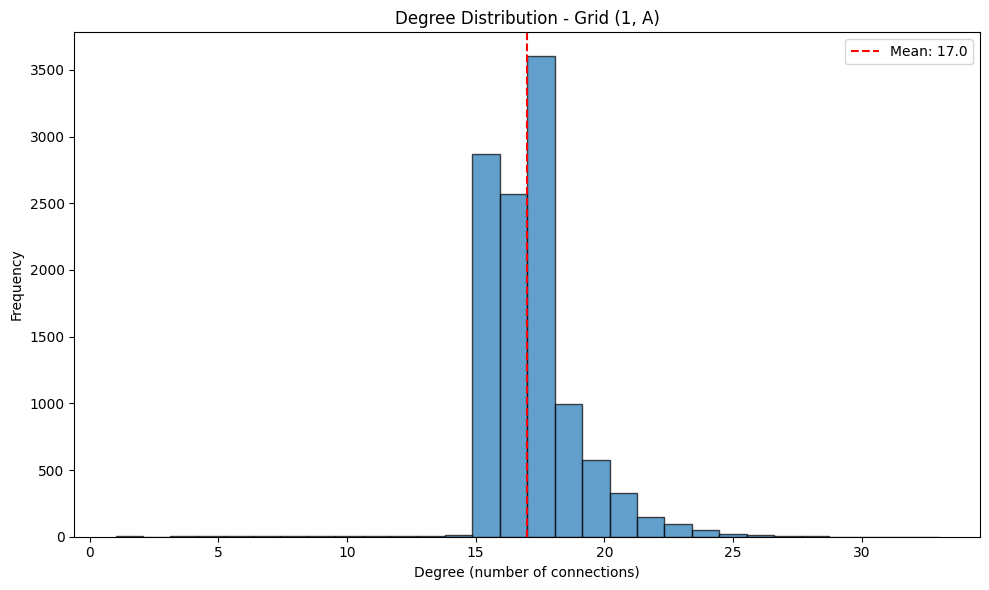

In [29]:
fig, ax = viz.plot_degree_distribution(
    graphs, 
    sample_name='Grid (1, A)'
)
plt.show()

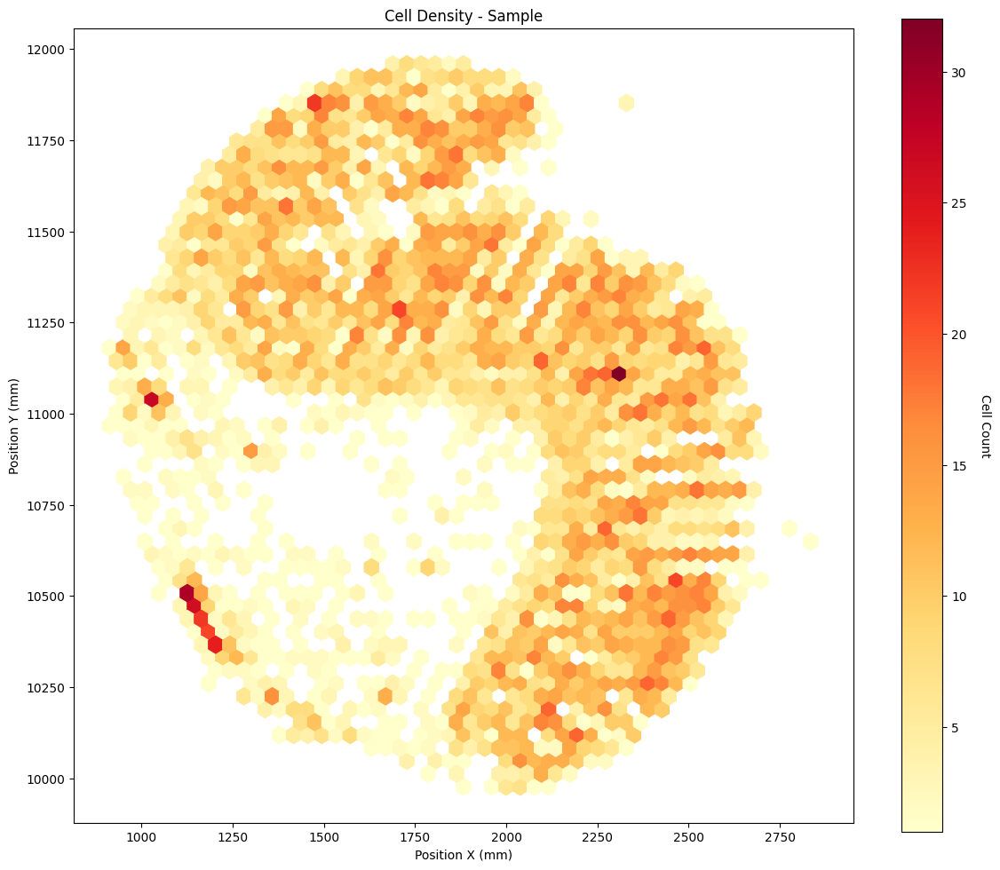

In [18]:
fig, ax = viz.plot_spatial_density(
    graphs['Grid (1, A)'],
    bins=50
)
plt.show()